## Data Import and Cleaning

In [1]:
#import tools
import itertools
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import pickle

import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn import linear_model
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.preprocessing import PolynomialFeatures
from sklearn.preprocessing import StandardScaler
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)


In [2]:
#read golf csv (with stats from 2010 to 2018)
df = pd.read_csv('PGA_Data_Historical.csv')

In [3]:
#check shape of csv
df.shape

(2740403, 5)

In [4]:
#change csv format from long to wide
df = df.set_index(['Player Name', 'Variable', 'Season'])['Value'].unstack('Variable').reset_index()





In [5]:
#check new csv shape
df.shape

(11223, 2083)

In [6]:
#show first 50 rows
df.head(50)

Variable     Player Name  Season  \
0         A.J. McInerney    2018   
1         Aaron Baddeley    2010   
2         Aaron Baddeley    2011   
3         Aaron Baddeley    2012   
4         Aaron Baddeley    2013   
5         Aaron Baddeley    2014   
6         Aaron Baddeley    2015   
7         Aaron Baddeley    2016   
8         Aaron Baddeley    2017   
9         Aaron Baddeley    2018   
10        Aaron Goldberg    2010   
11        Aaron Goldberg    2011   
12        Aaron Goldberg    2012   
13        Aaron Goldberg    2013   
14        Aaron Goldberg    2014   
15         Aaron Krueger    2014   
16            Aaron Pike    2015   
17            Aaron Pike    2016   
18             Aaron Rai    2016   
19             Aaron Rai    2017   
20             Aaron Rai    2018   
21        Aaron Townsend    2010   
22        Aaron Townsend    2011   
23        Aaron Townsend    2012   
24        Aaron Townsend    2013   
25        Aaron Townsend    2014   
26        Aaron Townsend    2015   
27         Aaron Watkins    2010   
28         Aaron Watkins    2011   
29         Aaron Watkins    2012   
30         Aaron Watkins    2013   
31         Aaron Watkins    2014   
32         Aaron Watkins    2015   
33            Aaron Wise    2016   
34            Aaron Wise    2017   
35            Aaron Wise    2018   
36         Abraham Ancer    2015   
37         Abraham Ancer    2016   
38         Abraham Ancer    2017   
39         Abraham Ancer    2018   
40            Adam Bland    2010   
41            Adam Bland    2011   
42            Adam Bland    2012   
43            Adam Bland    2013   
44            Adam Bland    2014   
45            Adam Bland    2015   
46            Adam Bland    2016   
47            Adam Bland    2017   
48            Adam Bland    2018   
49            Adam Blyth    2010   

Variable % of Potential Pts won - FedExCup Playoffs - (# OF TOP 10'S)  \
0                                                       NaN             
1                                                       NaN             
2                                                         1             
3                                                       NaN             
4                                                       NaN             
5                                                       NaN             
6                                                       NaN             
7                                                       NaN             
8                                                       NaN             
9                                                       NaN             
10                                                      NaN             
11                                                      NaN             
12                                                      NaN             
13                                                      NaN             
14                                                      NaN             
15                                                      NaN             
16                                                      NaN             
17                                                      NaN             
18                                                      NaN             
19                                                      NaN             
20                                                      NaN             
21                                                      NaN             
22                                                      NaN             
23                                                      NaN             
24                                                      NaN             
25                                                      NaN             
26                                                      NaN             
27                                                      NaN             
28                                            

In [8]:
#drop rows without money earnings since that will not work with testing
df = df.dropna(how='any', subset=['Total Money (Official and Unofficial) - (EVENTS)'])

In [9]:
#check new shape
df.shape

(3681, 2083)

In [10]:
#check for unique player names
df['Player Name'].nunique()

1051

In [11]:
#create new df with only certain columns
df = df[['Player Name', 'Season', '1-Putts per Round - (AVG)', 'Proximity to Hole - (AVG)', '2-Putts per Round - (AVG)', 'Apex Height - (AVG.)', 'Average Distance of Putts made - (AVG DIST.)', 'Average Distance to Hole After Tee Shot - (AVG)', 'Average Going for it Shot Distance (in Yards) - (AVG)', 'Back 9 Par 3 Scoring Average - (AVG)', 'Back 9 Par 4 Scoring Average - (AVG)', 'Back 9 Par 5 Scoring Average - (AVG)', 'Back 9 Scoring Average - (AVG)','Ball Speed - (AVG.)', 'Ball Striking - (GIR RANK)', 'Birdie Average - (AVG)', 'Birdie or Better Percentage - (%)','Bogey Avoidance - (% MAKES BOGEY)', 'Carry Distance - (AVG.)', 'Bounce Back - (%)', 'Club Head Speed - (AVG.)','Distance from Center of Fairway - (AVG)', 'Driving Accuracy Percentage - (%)', 'Driving Distance - (AVG.)','Fairway Bunker Tendency - (%)', 'Front 9 Par 3 Scoring Average - (AVG)', 'Front 9 Par 4 Scoring Average - (AVG)','Front 9 Par 5 Scoring Average - (AVG)', 'Front 9 Scoring Average - (AVG)', 'Greens in Regulation Percentage - (%)', 'Greens or Fringe in Regulation - (%)','Top 10 Finishes - (TOP 10)', 'Top 10 Finishes - (1ST)', 'Scrambling from the Rough - (%)', 'Scrambling from the Sand - (%)','Scrambling from the Fringe - (%)', 'Scrambling - (%)', 'Putts Per Round - (AVG)', 'Total Money (Official and Unofficial) - (EVENTS)', 'Percentage of potential money won - (OFFICIAL MONEY WON)']].copy()

In [12]:
#replace nan top 10 finishes with 0
df['Top 10 Finishes - (TOP 10)'] = df['Top 10 Finishes - (TOP 10)'].replace(np.nan, 0)

In [13]:
#replace nan 1st place finishes with 0
df['Top 10 Finishes - (1ST)'] = df['Top 10 Finishes - (1ST)'].replace(np.nan, 0)

In [14]:
#check new shape
df.shape

(3681, 40)

In [15]:
#drop columns with nan driving distance
df = df.dropna(how='any', subset=['Driving Distance - (AVG.)'])

In [16]:
#check new shape
df.shape

(1678, 40)

In [17]:
df.head(100)

Variable,Player Name,Season,1-Putts per Round - (AVG),Proximity to Hole - (AVG),2-Putts per Round - (AVG),Apex Height - (AVG.),Average Distance of Putts made - (AVG DIST.),Average Distance to Hole After Tee Shot - (AVG),Average Going for it Shot Distance (in Yards) - (AVG),Back 9 Par 3 Scoring Average - (AVG),Back 9 Par 4 Scoring Average - (AVG),Back 9 Par 5 Scoring Average - (AVG),Back 9 Scoring Average - (AVG),Ball Speed - (AVG.),Ball Striking - (GIR RANK),Birdie Average - (AVG),Birdie or Better Percentage - (%),Bogey Avoidance - (% MAKES BOGEY),Carry Distance - (AVG.),Bounce Back - (%),Club Head Speed - (AVG.),Distance from Center of Fairway - (AVG),Driving Accuracy Percentage - (%),Driving Distance - (AVG.),Fairway Bunker Tendency - (%),Front 9 Par 3 Scoring Average - (AVG),Front 9 Par 4 Scoring Average - (AVG),Front 9 Par 5 Scoring Average - (AVG),Front 9 Scoring Average - (AVG),Greens in Regulation Percentage - (%),Greens or Fringe in Regulation - (%),Top 10 Finishes - (TOP 10),Top 10 Finishes - (1ST),Scrambling from the Rough - (%),Scrambling from the Sand - (%),Scrambling from the Fringe - (%),Scrambling - (%),Putts Per Round - (AVG),Total Money (Official and Unofficial) - (EVENTS),Percentage of potential money won - (OFFICIAL MONEY WON)
1,Aaron Baddeley,2010,7.28,"37' 9""",10.13,"100' 1""","4' 5""",166.1,257.8,3.09,4.02,4.72,35.51,177.01,164,3.76,21.63,16.73,286.6,27.72,119.95,"25' 11""",56.65,298.9,4.6,3.08,4.01,4.66,35.10,64.60,69.51,2,0,54.58,57.66,91.04,57.10,28.57,26,"$879,317"
2,Aaron Baddeley,2011,7.31,"37' 5""",9.48,"94' 1""","4' 3""",168.4,251.0,3.12,4.01,4.70,35.40,176.34,97,4.08,23.09,16.38,281.7,26.15,119.14,"26' 2""",55.67,296.2,6.0,3.08,3.99,4.48,34.82,65.48,71.86,5,1,49.32,56.73,94.74,59.44,28.39,24,"$3,094,692"
3,Aaron Baddeley,2012,7.96,"38' 3""",9.39,"97' 2""","4' 2""",169.4,253.2,3.10,4.09,4.68,35.92,176.75,190,3.51,19.75,18.83,288.8,18.97,119.05,"28' 0""",54.30,292.0,7.5,3.15,4.08,4.61,35.64,58.10,64.24,3,0,59.26,65.52,96.23,59.85,28.07,22,"$1,215,753"
4,Aaron Baddeley,2013,8.17,"39' 3""",9.09,"92' 1""","4' 4""",179.8,253.6,3.11,4.15,4.60,35.97,176.32,178,3.50,20.20,19.87,282.6,21.52,118.89,"27' 2""",50.71,288.5,6.6,3.11,4.07,4.63,35.61,58.00,61.21,2,0,54.50,55.32,94.59,57.72,27.80,24,"$721,023"
5,Aaron Baddeley,2014,7.94,"39' 1""",9.51,"101' 9""","4' 5""",176.5,250.1,3.16,4.07,4.61,35.65,174.49,174,3.54,19.83,17.75,283.3,20.36,117.54,"29' 3""",52.29,293.8,7.3,3.03,4.09,4.64,35.49,59.80,62.99,2,0,58.01,57.14,89.74,60.27,28.15,24,"$942,558"
6,Aaron Baddeley,2015,7.69,"38' 11""",9.69,"106' 4""","4' 6""",173.9,247.8,3.01,4.10,4.58,35.46,175.43,172,3.57,20.65,16.37,295.7,21.08,118.04,"26' 11""",50.29,294.1,8.4,2.97,4.10,4.55,35.30,62.46,67.26,1,0,57.78,60.23,86.67,61.00,28.28,25,"$439,925"
7,Aaron Baddeley,2016,7.90,"37' 7""",9.40,"99' 6""","4' 2""",178.1,257.3,3.07,4.01,4.66,35.27,172.75,154,3.63,20.72,15.29,281.3,24.24,116.20,"23' 11""",55.42,291.7,4.8,3.06,4.02,4.63,35.26,63.11,66.07,5,1,59.75,62.83,91.67,64.30,28.06,28,"$1,644,914"
8,Aaron Baddeley,2017,7.37,"38' 6""",9.98,"91' 5""","4' 1""",179.1,263.5,3.10,4.06,4.70,35.84,173.03,166,3.49,19.69,16.57,277.2,25.64,115.80,"27' 10""",52.25,292.6,7.2,3.03,4.07,4.70,35.56,62.57,67.27,2,0,50.00,67.24,83.33,59.90,28.49,20,"$755,356"
9,Aaron Baddeley,2018,7.00,"37' 0""",10.19,"99' 11""","3' 12""",173.8,256.8,3.10,4.03,4.65,35.38,170.68,163,3.33,19.16,16.24,278.2,19.25,113.89,"23' 6""",53.27,295.3,7.0,3.11,4.02,4.70,35.36,63.39,68.57,1,0,54.12,57.01,92.45,61.09,28.85,27,"$725,927"
30,Aaron Watkins,2013,7.25,"36' 7""",9.95,"97' 11""","4' 3""",185.0,252.2,3.07,4.10,4.69,35.84,158.44,152,3.45,19.32,17.93,259.2,19.26,106.93,"27' 0""",63.03,277.1,7.0,3.17,4.03,4.66,35.45,62.25,66.19,1,0,56.31,49.15,93.94,59.53,28.75,19,"$217,495"


In [18]:
#drop any other rows with null values
df.dropna()


Variable,Player Name,Season,1-Putts per Round - (AVG),Proximity to Hole - (AVG),2-Putts per Round - (AVG),Apex Height - (AVG.),Average Distance of Putts made - (AVG DIST.),Average Distance to Hole After Tee Shot - (AVG),Average Going for it Shot Distance (in Yards) - (AVG),Back 9 Par 3 Scoring Average - (AVG),Back 9 Par 4 Scoring Average - (AVG),Back 9 Par 5 Scoring Average - (AVG),Back 9 Scoring Average - (AVG),Ball Speed - (AVG.),Ball Striking - (GIR RANK),Birdie Average - (AVG),Birdie or Better Percentage - (%),Bogey Avoidance - (% MAKES BOGEY),Carry Distance - (AVG.),Bounce Back - (%),Club Head Speed - (AVG.),Distance from Center of Fairway - (AVG),Driving Accuracy Percentage - (%),Driving Distance - (AVG.),Fairway Bunker Tendency - (%),Front 9 Par 3 Scoring Average - (AVG),Front 9 Par 4 Scoring Average - (AVG),Front 9 Par 5 Scoring Average - (AVG),Front 9 Scoring Average - (AVG),Greens in Regulation Percentage - (%),Greens or Fringe in Regulation - (%),Top 10 Finishes - (TOP 10),Top 10 Finishes - (1ST),Scrambling from the Rough - (%),Scrambling from the Sand - (%),Scrambling from the Fringe - (%),Scrambling - (%),Putts Per Round - (AVG),Total Money (Official and Unofficial) - (EVENTS),Percentage of potential money won - (OFFICIAL MONEY WON)
1,Aaron Baddeley,2010,7.28,"37' 9""",10.13,"100' 1""","4' 5""",166.1,257.8,3.09,4.02,4.72,35.51,177.01,164,3.76,21.63,16.73,286.6,27.72,119.95,"25' 11""",56.65,298.9,4.6,3.08,4.01,4.66,35.10,64.60,69.51,2,0,54.58,57.66,91.04,57.10,28.57,26,"$879,317"
2,Aaron Baddeley,2011,7.31,"37' 5""",9.48,"94' 1""","4' 3""",168.4,251.0,3.12,4.01,4.70,35.40,176.34,97,4.08,23.09,16.38,281.7,26.15,119.14,"26' 2""",55.67,296.2,6.0,3.08,3.99,4.48,34.82,65.48,71.86,5,1,49.32,56.73,94.74,59.44,28.39,24,"$3,094,692"
3,Aaron Baddeley,2012,7.96,"38' 3""",9.39,"97' 2""","4' 2""",169.4,253.2,3.10,4.09,4.68,35.92,176.75,190,3.51,19.75,18.83,288.8,18.97,119.05,"28' 0""",54.30,292.0,7.5,3.15,4.08,4.61,35.64,58.10,64.24,3,0,59.26,65.52,96.23,59.85,28.07,22,"$1,215,753"
4,Aaron Baddeley,2013,8.17,"39' 3""",9.09,"92' 1""","4' 4""",179.8,253.6,3.11,4.15,4.60,35.97,176.32,178,3.50,20.20,19.87,282.6,21.52,118.89,"27' 2""",50.71,288.5,6.6,3.11,4.07,4.63,35.61,58.00,61.21,2,0,54.50,55.32,94.59,57.72,27.80,24,"$721,023"
5,Aaron Baddeley,2014,7.94,"39' 1""",9.51,"101' 9""","4' 5""",176.5,250.1,3.16,4.07,4.61,35.65,174.49,174,3.54,19.83,17.75,283.3,20.36,117.54,"29' 3""",52.29,293.8,7.3,3.03,4.09,4.64,35.49,59.80,62.99,2,0,58.01,57.14,89.74,60.27,28.15,24,"$942,558"
6,Aaron Baddeley,2015,7.69,"38' 11""",9.69,"106' 4""","4' 6""",173.9,247.8,3.01,4.10,4.58,35.46,175.43,172,3.57,20.65,16.37,295.7,21.08,118.04,"26' 11""",50.29,294.1,8.4,2.97,4.10,4.55,35.30,62.46,67.26,1,0,57.78,60.23,86.67,61.00,28.28,25,"$439,925"
7,Aaron Baddeley,2016,7.90,"37' 7""",9.40,"99' 6""","4' 2""",178.1,257.3,3.07,4.01,4.66,35.27,172.75,154,3.63,20.72,15.29,281.3,24.24,116.20,"23' 11""",55.42,291.7,4.8,3.06,4.02,4.63,35.26,63.11,66.07,5,1,59.75,62.83,91.67,64.30,28.06,28,"$1,644,914"
8,Aaron Baddeley,2017,7.37,"38' 6""",9.98,"91' 5""","4' 1""",179.1,263.5,3.10,4.06,4.70,35.84,173.03,166,3.49,19.69,16.57,277.2,25.64,115.80,"27' 10""",52.25,292.6,7.2,3.03,4.07,4.70,35.56,62.57,67.27,2,0,50.00,67.24,83.33,59.90,28.49,20,"$755,356"
9,Aaron Baddeley,2018,7.00,"37' 0""",10.19,"99' 11""","3' 12""",173.8,256.8,3.10,4.03,4.65,35.38,170.68,163,3.33,19.16,16.24,278.2,19.25,113.89,"23' 6""",53.27,295.3,7.0,3.11,4.02,4.70,35.36,63.39,68.57,1,0,54.12,57.01,92.45,61.09,28.85,27,"$725,927"
30,Aaron Watkins,2013,7.25,"36' 7""",9.95,"97' 11""","4' 3""",185.0,252.2,3.07,4.10,4.69,35.84,158.44,152,3.45,19.32,17.93,259.2,19.26,106.93,"27' 0""",63.03,277.1,7.0,3.17,4.03,4.66,35.45,62.25,66.19,1,0,56.31,49.15,93.94,59.53,28.75,19,"$217,495"


In [19]:
df.shape

(1678, 40)

In [20]:
#check df info (many columns have Dtype of 'object' so these will need to be changed to number formats)
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1678 entries, 1 to 11218
Data columns (total 40 columns):
 #   Column                                                    Non-Null Count  Dtype 
---  ------                                                    --------------  ----- 
 0   Player Name                                               1678 non-null   object
 1   Season                                                    1678 non-null   int64 
 2   1-Putts per Round - (AVG)                                 1678 non-null   object
 3   Proximity to Hole - (AVG)                                 1678 non-null   object
 4   2-Putts per Round - (AVG)                                 1678 non-null   object
 5   Apex Height - (AVG.)                                      1678 non-null   object
 6   Average Distance of Putts made - (AVG DIST.)              1678 non-null   object
 7   Average Distance to Hole After Tee Shot - (AVG)           1678 non-null   object
 8   Average Going for it Shot D

In [21]:
#change columns with object Dtypes to integers or floats
df[df.columns[2:3]] = df[df.columns[2:3]].astype(str).astype(float)
df[df.columns[4:5]] = df[df.columns[4:5]].astype(str).astype(float)
df[df.columns[7:21]] = df[df.columns[7:21]].astype(str).astype(float)
df[df.columns[22:31]] = df[df.columns[22:31]].astype(str).astype(float)
df[df.columns[31:33]] = df[df.columns[31:33]].astype(str).astype(int)
df[df.columns[33:38]] = df[df.columns[33:38]].astype(str).astype(float)
df[df.columns[38:39]] = df[df.columns[38:39]].astype(str).astype(int)
df['Percentage of potential money won - (OFFICIAL MONEY WON)'] = df['Percentage of potential money won - (OFFICIAL MONEY WON)'].replace('[\$,]', '', regex=True).astype(int)


In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1678 entries, 1 to 11218
Data columns (total 40 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Player Name                                               1678 non-null   object 
 1   Season                                                    1678 non-null   int64  
 2   1-Putts per Round - (AVG)                                 1678 non-null   float64
 3   Proximity to Hole - (AVG)                                 1678 non-null   object 
 4   2-Putts per Round - (AVG)                                 1678 non-null   float64
 5   Apex Height - (AVG.)                                      1678 non-null   object 
 6   Average Distance of Putts made - (AVG DIST.)              1678 non-null   object 
 7   Average Distance to Hole After Tee Shot - (AVG)           1678 non-null   float64
 8   Average Going for

In [23]:
df.describe()

Variable,Season,1-Putts per Round - (AVG),2-Putts per Round - (AVG),Average Distance to Hole After Tee Shot - (AVG),Average Going for it Shot Distance (in Yards) - (AVG),Back 9 Par 3 Scoring Average - (AVG),Back 9 Par 4 Scoring Average - (AVG),Back 9 Par 5 Scoring Average - (AVG),Back 9 Scoring Average - (AVG),Ball Speed - (AVG.),Ball Striking - (GIR RANK),Birdie Average - (AVG),Birdie or Better Percentage - (%),Bogey Avoidance - (% MAKES BOGEY),Carry Distance - (AVG.),Bounce Back - (%),Club Head Speed - (AVG.),Driving Accuracy Percentage - (%),Driving Distance - (AVG.),Fairway Bunker Tendency - (%),Front 9 Par 3 Scoring Average - (AVG),Front 9 Par 4 Scoring Average - (AVG),Front 9 Par 5 Scoring Average - (AVG),Front 9 Scoring Average - (AVG),Greens in Regulation Percentage - (%),Greens or Fringe in Regulation - (%),Top 10 Finishes - (TOP 10),Top 10 Finishes - (1ST),Scrambling from the Rough - (%),Scrambling from the Sand - (%),Scrambling from the Fringe - (%),Scrambling - (%),Putts Per Round - (AVG),Total Money (Official and Unofficial) - (EVENTS),Percentage of potential money won - (OFFICIAL MONEY WON)
count,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.00000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1678.000000,1.678000e+03
mean,2014.004768,6.891019,10.131329,174.517044,255.670918,3.066752,4.056234,4.695095,35.560948,168.058164,93.671633,3.52413,20.030810,16.854076,275.079619,20.062610,113.480381,61.440560,290.807688,6.174553,3.060024,4.039690,4.649881,35.293302,65.661675,70.012515,2.674613,0.235995,55.866901,51.535584,88.943278,58.115638,29.163331,24.982122,1.487718e+06
std,2.608637,0.467912,0.447578,6.522796,5.121781,0.057929,0.045612,0.083847,0.363464,6.069814,53.968509,0.29221,1.690613,1.823277,11.500098,3.024939,4.190596,5.058845,8.916631,1.124266,0.054785,0.043762,0.081226,0.337785,2.745411,2.837653,2.443682,0.578148,5.098827,7.187582,4.912346,3.384769,0.518468,3.906592,1.408826e+06
min,2010.000000,5.110000,8.570000,149.800000,236.600000,2.880000,3.900000,4.300000,34.340000,151.840000,1.000000,2.38000,13.430000,12.080000,241.400000,8.900000,100.910000,43.020000,266.400000,2.600000,2.890000,3.900000,4.400000,34.110000,53.540000,56.790000,0.000000,0.000000,37.500000,23.810000,68.420000,44.010000,27.510000,13.000000,2.465000e+04
25%,2012.000000,6.590000,9.840000,170.800000,252.300000,3.030000,4.030000,4.640000,35.320000,163.892500,47.000000,3.33000,18.940000,15.660000,267.300000,17.962500,110.580000,57.942500,284.900000,5.400000,3.020000,4.010000,4.590000,35.070000,63.830000,68.202500,1.000000,0.000000,52.670000,46.827500,85.940000,55.900000,28.810000,22.000000,5.667222e+05
50%,2014.000000,6.910000,10.150000,174.650000,255.800000,3.070000,4.050000,4.700000,35.540000,167.685000,94.000000,3.52000,20.000000,16.730000,274.800000,20.090000,113.230000,61.430000,290.550000,6.100000,3.060000,4.040000,4.650000,35.280000,65.790000,70.135000,2.000000,0.000000,55.920000,51.560000,89.345000,58.275000,29.140000,25.000000,1.044618e+06
75%,2016.000000,7.220000,10.430000,178.800000,259.200000,3.100000,4.080000,4.750000,35.780000,172.180000,140.000000,3.71000,21.087500,17.920000,282.800000,22.115000,116.300000,64.910000,296.400000,6.900000,3.090000,4.070000,4.710000,35.490000,67.580000,71.947500,4.000000,0.000000,59.207500,56.510000,92.310000,60.420000,29.520000,28.000000,1.887149e+06
max,2018.000000,8.260000,11.550000,192.100000,274.200000,3.280000,4.290000,5.020000,37.580000,186.790000,193.000000,4.71000,27.250000,25.430000,314.800000,34.440000,128.180000,76.880000,319.700000,10.900000,3.250000,4.220000,4.900000,36.820000,73.520000,77.520000,15.000000,5.000000,78.690000,72.410000,100.000000,69.330000,31.000000,37.000000,1.203046e+07


In [24]:
#change Percentage of Monye won column name to something more easily readable
df = df.rename(columns = {"Percentage of potential money won - (OFFICIAL MONEY WON)":"OFFICIAL MONEY WON"})

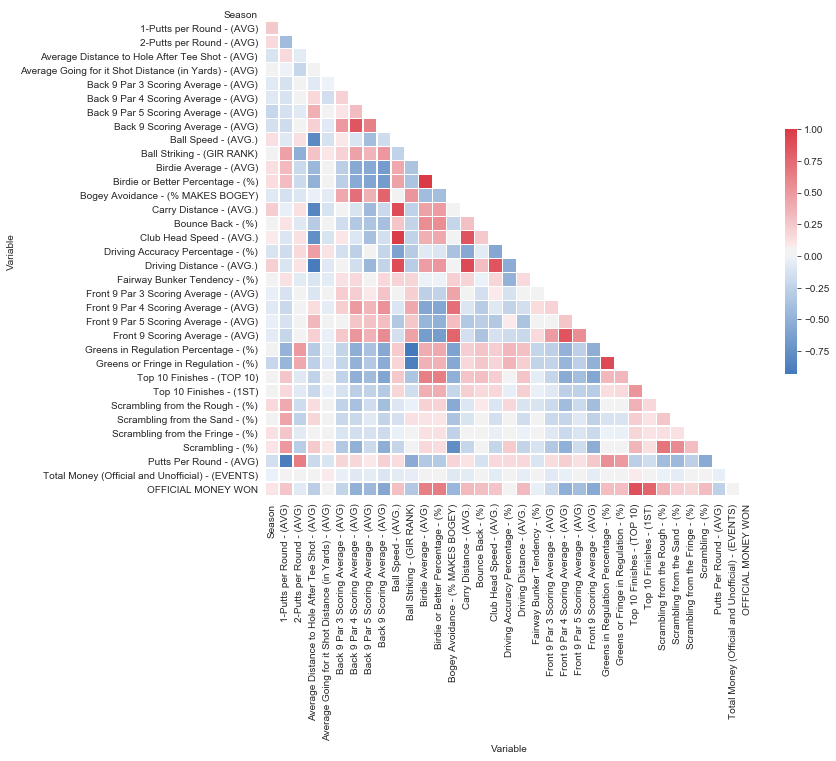

In [25]:
#check correlation matrix
def CorrMtx(df, dropDuplicates = True):

    # Your dataset is already a correlation matrix.
    # If you have a dateset where you need to include the calculation
    # of a correlation matrix, just uncomment the line below:
    # df = df.corr()

    # Exclude duplicate correlations by masking uper right values
    if dropDuplicates:    
        mask = np.zeros_like(df, dtype=np.bool)
        mask[np.triu_indices_from(mask)] = True

    # Set background color / chart style
    sns.set_style(style = 'white')

    # Set up  matplotlib figure
    f, ax = plt.subplots(figsize=(11, 9))

    # Add diverging colormap from red to blue
    cmap = sns.diverging_palette(250, 10, as_cmap=True)

    # Draw correlation plot with or without duplicates
    if dropDuplicates:
        sns.heatmap(df, mask=mask, cmap=cmap, 
                square=True,
                linewidth=.5, cbar_kws={"shrink": .5}, ax=ax)
    else:
        sns.heatmap(df, cmap=cmap, 
                square=True,
                linewidth=.5, cbar_kws={"shrink": .5}, ax=ax)


CorrMtx(df.corr(), dropDuplicates = True)

In [29]:
#Create money won per tournament column by dividing official money won by number of events
df['MONEY WON PER TOURNAMENT'] = df['OFFICIAL MONEY WON']/df['Total Money (Official and Unofficial) - (EVENTS)']
df.head()

Variable,Player Name,Season,1-Putts per Round - (AVG),Proximity to Hole - (AVG),2-Putts per Round - (AVG),Apex Height - (AVG.),Average Distance of Putts made - (AVG DIST.),Average Distance to Hole After Tee Shot - (AVG),Average Going for it Shot Distance (in Yards) - (AVG),Back 9 Par 3 Scoring Average - (AVG),Back 9 Par 4 Scoring Average - (AVG),Back 9 Par 5 Scoring Average - (AVG),Back 9 Scoring Average - (AVG),Ball Speed - (AVG.),Ball Striking - (GIR RANK),Birdie Average - (AVG),Birdie or Better Percentage - (%),Bogey Avoidance - (% MAKES BOGEY),Carry Distance - (AVG.),Bounce Back - (%),Club Head Speed - (AVG.),Distance from Center of Fairway - (AVG),Driving Accuracy Percentage - (%),Driving Distance - (AVG.),Fairway Bunker Tendency - (%),Front 9 Par 3 Scoring Average - (AVG),Front 9 Par 4 Scoring Average - (AVG),Front 9 Par 5 Scoring Average - (AVG),Front 9 Scoring Average - (AVG),Greens in Regulation Percentage - (%),Greens or Fringe in Regulation - (%),Top 10 Finishes - (TOP 10),Top 10 Finishes - (1ST),Scrambling from the Rough - (%),Scrambling from the Sand - (%),Scrambling from the Fringe - (%),Scrambling - (%),Putts Per Round - (AVG),Total Money (Official and Unofficial) - (EVENTS),OFFICIAL MONEY WON,MONEY WON PER TOURNAMENT
1,Aaron Baddeley,2010,7.28,"37' 9""",10.13,"100' 1""","4' 5""",166.1,257.8,3.09,4.02,4.72,35.51,177.01,164.0,3.76,21.63,16.73,286.6,27.72,119.95,"25' 11""",56.65,298.9,4.6,3.08,4.01,4.66,35.10,64.60,69.51,2,0,54.58,57.66,91.04,57.10,28.57,26,879317,33819.884615
2,Aaron Baddeley,2011,7.31,"37' 5""",9.48,"94' 1""","4' 3""",168.4,251.0,3.12,4.01,4.70,35.40,176.34,97.0,4.08,23.09,16.38,281.7,26.15,119.14,"26' 2""",55.67,296.2,6.0,3.08,3.99,4.48,34.82,65.48,71.86,5,1,49.32,56.73,94.74,59.44,28.39,24,3094692,128945.500000
3,Aaron Baddeley,2012,7.96,"38' 3""",9.39,"97' 2""","4' 2""",169.4,253.2,3.10,4.09,4.68,35.92,176.75,190.0,3.51,19.75,18.83,288.8,18.97,119.05,"28' 0""",54.30,292.0,7.5,3.15,4.08,4.61,35.64,58.10,64.24,3,0,59.26,65.52,96.23,59.85,28.07,22,1215753,55261.500000
4,Aaron Baddeley,2013,8.17,"39' 3""",9.09,"92' 1""","4' 4""",179.8,253.6,3.11,4.15,4.60,35.97,176.32,178.0,3.50,20.20,19.87,282.6,21.52,118.89,"27' 2""",50.71,288.5,6.6,3.11,4.07,4.63,35.61,58.00,61.21,2,0,54.50,55.32,94.59,57.72,27.80,24,721023,30042.625000
5,Aaron Baddeley,2014,7.94,"39' 1""",9.51,"101' 9""","4' 5""",176.5,250.1,3.16,4.07,4.61,35.65,174.49,174.0,3.54,19.83,17.75,283.3,20.36,117.54,"29' 3""",52.29,293.8,7.3,3.03,4.09,4.64,35.49,59.80,62.99,2,0,58.01,57.14,89.74,60.27,28.15,24,942558,39273.250000


In [30]:
df.head()

Variable,Player Name,Season,1-Putts per Round - (AVG),Proximity to Hole - (AVG),2-Putts per Round - (AVG),Apex Height - (AVG.),Average Distance of Putts made - (AVG DIST.),Average Distance to Hole After Tee Shot - (AVG),Average Going for it Shot Distance (in Yards) - (AVG),Back 9 Par 3 Scoring Average - (AVG),Back 9 Par 4 Scoring Average - (AVG),Back 9 Par 5 Scoring Average - (AVG),Back 9 Scoring Average - (AVG),Ball Speed - (AVG.),Ball Striking - (GIR RANK),Birdie Average - (AVG),Birdie or Better Percentage - (%),Bogey Avoidance - (% MAKES BOGEY),Carry Distance - (AVG.),Bounce Back - (%),Club Head Speed - (AVG.),Distance from Center of Fairway - (AVG),Driving Accuracy Percentage - (%),Driving Distance - (AVG.),Fairway Bunker Tendency - (%),Front 9 Par 3 Scoring Average - (AVG),Front 9 Par 4 Scoring Average - (AVG),Front 9 Par 5 Scoring Average - (AVG),Front 9 Scoring Average - (AVG),Greens in Regulation Percentage - (%),Greens or Fringe in Regulation - (%),Top 10 Finishes - (TOP 10),Top 10 Finishes - (1ST),Scrambling from the Rough - (%),Scrambling from the Sand - (%),Scrambling from the Fringe - (%),Scrambling - (%),Putts Per Round - (AVG),Total Money (Official and Unofficial) - (EVENTS),OFFICIAL MONEY WON,MONEY WON PER TOURNAMENT
1,Aaron Baddeley,2010,7.28,"37' 9""",10.13,"100' 1""","4' 5""",166.1,257.8,3.09,4.02,4.72,35.51,177.01,164.0,3.76,21.63,16.73,286.6,27.72,119.95,"25' 11""",56.65,298.9,4.6,3.08,4.01,4.66,35.10,64.60,69.51,2,0,54.58,57.66,91.04,57.10,28.57,26,879317,33819.884615
2,Aaron Baddeley,2011,7.31,"37' 5""",9.48,"94' 1""","4' 3""",168.4,251.0,3.12,4.01,4.70,35.40,176.34,97.0,4.08,23.09,16.38,281.7,26.15,119.14,"26' 2""",55.67,296.2,6.0,3.08,3.99,4.48,34.82,65.48,71.86,5,1,49.32,56.73,94.74,59.44,28.39,24,3094692,128945.500000
3,Aaron Baddeley,2012,7.96,"38' 3""",9.39,"97' 2""","4' 2""",169.4,253.2,3.10,4.09,4.68,35.92,176.75,190.0,3.51,19.75,18.83,288.8,18.97,119.05,"28' 0""",54.30,292.0,7.5,3.15,4.08,4.61,35.64,58.10,64.24,3,0,59.26,65.52,96.23,59.85,28.07,22,1215753,55261.500000
4,Aaron Baddeley,2013,8.17,"39' 3""",9.09,"92' 1""","4' 4""",179.8,253.6,3.11,4.15,4.60,35.97,176.32,178.0,3.50,20.20,19.87,282.6,21.52,118.89,"27' 2""",50.71,288.5,6.6,3.11,4.07,4.63,35.61,58.00,61.21,2,0,54.50,55.32,94.59,57.72,27.80,24,721023,30042.625000
5,Aaron Baddeley,2014,7.94,"39' 1""",9.51,"101' 9""","4' 5""",176.5,250.1,3.16,4.07,4.61,35.65,174.49,174.0,3.54,19.83,17.75,283.3,20.36,117.54,"29' 3""",52.29,293.8,7.3,3.03,4.09,4.64,35.49,59.80,62.99,2,0,58.01,57.14,89.74,60.27,28.15,24,942558,39273.250000


In [31]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1678 entries, 1 to 11218
Data columns (total 41 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   Player Name                                            1678 non-null   object 
 1   Season                                                 1678 non-null   int64  
 2   1-Putts per Round - (AVG)                              1678 non-null   float64
 3   Proximity to Hole - (AVG)                              1678 non-null   object 
 4   2-Putts per Round - (AVG)                              1678 non-null   float64
 5   Apex Height - (AVG.)                                   1678 non-null   object 
 6   Average Distance of Putts made - (AVG DIST.)           1678 non-null   object 
 7   Average Distance to Hole After Tee Shot - (AVG)        1678 non-null   float64
 8   Average Going for it Shot Distance (in Yards) -

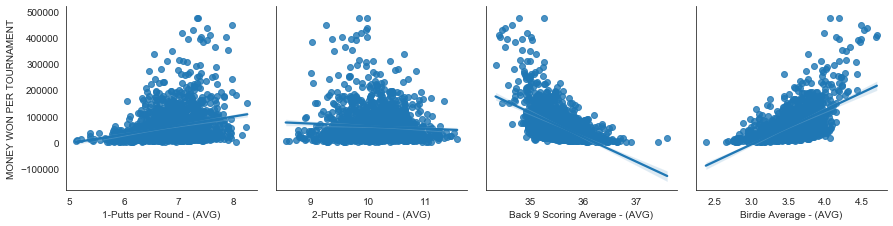

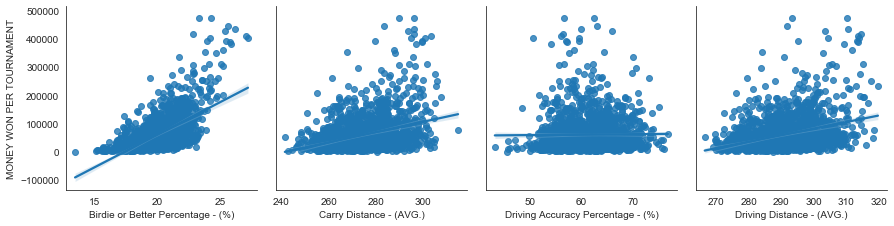

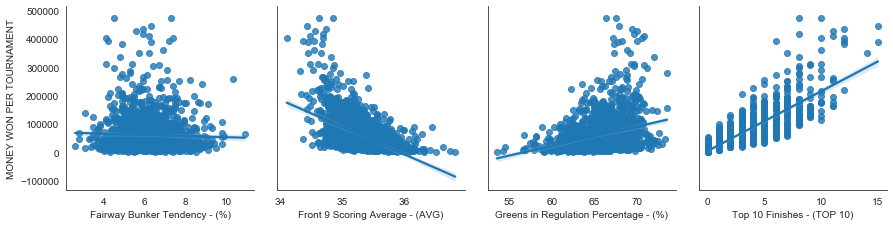

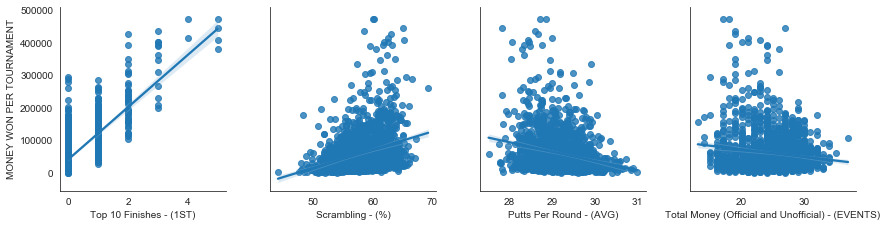

In [32]:
#create scatterplots with linear regression for key columns
features = ['1-Putts per Round - (AVG)', '2-Putts per Round - (AVG)', 'Back 9 Scoring Average - (AVG)',
            'Birdie Average - (AVG)', 'Birdie or Better Percentage - (%)',
            'Carry Distance - (AVG.)', 'Driving Accuracy Percentage - (%)', 'Driving Distance - (AVG.)',
            'Fairway Bunker Tendency - (%)', 'Front 9 Scoring Average - (AVG)','Greens in Regulation Percentage - (%)',
            'Top 10 Finishes - (TOP 10)', 'Top 10 Finishes - (1ST)', 'Scrambling - (%)',
            'Putts Per Round - (AVG)', 'Total Money (Official and Unofficial) - (EVENTS)' ]
n = 4
row_groups= [features[i:i+n] for i in range(0, len(features), n) ]
for i in row_groups:
    pp = sns.pairplot(data=df, y_vars=['MONEY WON PER TOURNAMENT'],x_vars=i, kind="reg", height=3)
    

In [37]:
#rename columns so that there are no spaces
df = df.rename(columns = {"1-Putts per Round - (AVG)":"1_putts_per_rd"})
df = df.rename(columns = {"2-Putts per Round - (AVG)":"2_putts_per_rd"})
df = df.rename(columns = {"Average Distance of Putts made - (AVG DIST.)":"avg_dist_putts_made"})
df = df.rename(columns = {"Average Distance to Hole After Tee Shot - (AVG)":"avg_dist_to_hole_2nd_shot"})
df = df.rename(columns = {"Average Going for it Shot Distance (in Yards) - (AVG)":"avg_going_for_it_distance"})
df = df.rename(columns = {"Back 9 Par 3 Scoring Average - (AVG)":"back_9_par_3_avg"})
df = df.rename(columns = {"Back 9 Par 4 Scoring Average - (AVG)":"back_9_par_4_avg"})
df = df.rename(columns = {"Back 9 Par 5 Scoring Average - (AVG)":"back_9_par_5_avg"})
df = df.rename(columns = {"Back 9 Scoring Average - (AVG)":"back_9_score_avg"})
df = df.rename(columns = {"Ball Speed - (AVG.)":"ball_speed"})
df = df.rename(columns = {"Ball Striking - (GIR RANK)":"GIR_rank"})
df = df.rename(columns = {"Birdie Average - (AVG)":"birdie_avg"})
df = df.rename(columns = {"Birdie or Better Percentage - (%)":"birdie_or_better_pct"})
df = df.rename(columns = {"Bogey Avoidance - (% MAKES BOGEY)":"bogey_pct"})
df = df.rename(columns = {"Carry Distance - (AVG.)":"carry_distance"})
df = df.rename(columns = {"Bounce Back - (%)":"bounce_back_pct"})
df = df.rename(columns = {"Club Head Speed - (AVG.)":"club_head_speed"})
df = df.rename(columns = {"Driving Accuracy Percentage - (%)":"driving_accuracy_pct"})
df = df.rename(columns = {"Driving Distance - (AVG.)":"driving_distance_avg"})
df = df.rename(columns = {"Fairway Bunker Tendency - (%)":"fairway_bunker_pct"})
df = df.rename(columns = {"Front 9 Par 3 Scoring Average - (AVG)":"front_9_par_3_avg"})
df = df.rename(columns = {"Front 9 Par 4 Scoring Average - (AVG)":"front_9_par_4_avg"})
df = df.rename(columns = {"Front 9 Par 5 Scoring Average - (AVG)":"front_9_par_5_avg"})
df = df.rename(columns = {"Front 9 Scoring Average - (AVG)":"front_9_score_avg"})
df = df.rename(columns = {"Greens in Regulation Percentage - (%)":"GIR_pct"})
df = df.rename(columns = {"Greens or Fringe in Regulation - (%)":"GoFIR_pct"})
df = df.rename(columns = {"Top 10 Finishes - (TOP 10)":"top_10_finishes"})
df = df.rename(columns = {"Top 10 Finishes - (1ST)":"1st_place_finishes"})
df = df.rename(columns = {"Scrambling from the Rough - (%)":"rough_scrambling_pct"})
df = df.rename(columns = {"Scrambling from the Sand - (%)":"sand_scrambling_pct"})
df = df.rename(columns = {"Scrambling from the Fringe - (%)":"fringe_scrambling_pct"})
df = df.rename(columns = {"Scrambling - (%)":"scrambling_pct"})
df = df.rename(columns = {"Putts Per Round - (AVG)":"putts_per_round_avg"})
df = df.rename(columns = {"Total Money (Official and Unofficial) - (EVENTS)":"events"})
df = df.rename(columns = {"MONEY WON PER TOURNAMENT":"money_per_tourney"})

In [38]:
df['score_avg'] = df['front_9_score_avg'] + df['back_9_score_avg']

In [39]:
#check correlations between columns before making multiple linear regression model
df.corr()

Variable,1_putts_per_rd,2_putts_per_rd,avg_dist_to_hole_2nd_shot,avg_going_for_it_distance,back_9_par_3_avg,back_9_par_4_avg,back_9_par_5_avg,back_9_score_avg,ball_speed,GIR_rank,birdie_avg,birdie_or_better_pct,bogey_pct,carry_distance,bounce_back_pct,club_head_speed,driving_accuracy_pct,driving_distance_avg,fairway_bunker_pct,front_9_par_3_avg,front_9_par_4_avg,front_9_par_5_avg,front_9_score_avg,GIR_pct,GoFIR_pct,top_10_finishes,1st_place_finishes,rough_scrambling_pct,sand_scrambling_pct,fringe_scrambling_pct,scrambling_pct,putts_per_round_avg,events,OFFICIAL MONEY WON,money_per_tourney,score_avg
Variable,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1_putts_per_rd,1.000000,-0.413715,0.159838,-0.002813,-0.127559,-0.122877,-0.136948,-0.173853,-0.078053,0.462869,0.326260,0.315765,-0.132840,-0.026316,0.115734,-0.097751,-0.170901,-0.106121,0.132839,-0.121261,-0.199807,-0.127310,-0.217202,-0.483574,-0.464532,0.263994,0.169169,0.411123,0.436906,0.261898,0.504207,-0.880145,0.019237,0.267757,0.255540,-0.219239
2_putts_per_rd,-0.413715,1.000000,-0.057249,-0.210797,0.061888,0.020510,-0.071342,0.001362,0.138566,-0.508220,-0.193485,-0.188249,-0.090866,0.122844,-0.080573,0.131757,0.162421,0.115175,-0.066232,0.010623,0.007955,0.017912,0.029559,0.495572,0.423255,-0.081379,-0.077304,-0.169620,-0.246730,-0.062943,-0.282753,0.638953,0.029677,-0.071686,-0.069132,0.016824
avg_dist_to_hole_2nd_shot,0.159838,-0.057249,1.000000,0.039003,-0.075101,0.166971,0.383385,0.212717,-0.798150,0.280518,-0.450939,-0.487003,-0.021206,-0.825559,-0.298237,-0.762322,0.471602,-0.905734,-0.105490,-0.097398,0.141976,0.341830,0.209821,-0.296819,-0.259162,-0.241257,-0.198499,0.153472,0.179297,0.033103,0.243197,-0.191995,0.014071,-0.275008,-0.271407,0.237915
avg_going_for_it_distance,-0.002813,-0.210797,0.039003,1.000000,-0.005600,-0.148656,0.044750,-0.073233,-0.124900,0.098746,0.033784,0.020876,-0.060743,-0.116256,0.066793,-0.112079,0.113346,-0.082530,-0.058115,0.008186,-0.048452,0.063598,-0.027140,-0.034150,-0.076799,0.031060,-0.021121,0.051089,0.049839,0.023152,0.092233,-0.106235,0.077463,0.043607,0.030026,-0.057453
back_9_par_3_avg,-0.127559,0.061888,-0.075101,-0.005600,1.000000,0.201163,0.107615,0.500495,0.089169,0.202492,-0.278110,-0.266818,0.424353,0.065761,-0.161457,0.097464,-0.145194,0.073012,0.118288,0.226039,0.219299,0.050913,0.253883,-0.235715,-0.227571,-0.242100,-0.130398,-0.240853,-0.199286,-0.104936,-0.326042,0.180731,-0.031771,-0.228720,-0.218860,0.429739
back_9_par_4_avg,-0.122877,0.020510,0.166971,-0.148656,0.201163,1.000000,0.315346,0.851182,-0.102259,0.450802,-0.558286,-0.550772,0.721111,-0.115017,-0.322164,-0.086284,-0.261740,-0.155723,0.163495,0.226087,0.493553,0.268678,0.523582,-0.520906,-0.490140,-0.514687,-0.271992,-0.375201,-0.203743,-0.150795,-0.495791,0.176013,-0.079990,-0.496594,-0.469999,0.780636
back_9_par_5_avg,-0.136948,-0.071342,0.383385,0.044750,0.107615,0.315346,1.000000,0.626048,-0.404865,0.352458,-0.559308,-0.587695,0.380696,-0.424815,-0.346079,-0.379926,0.052252,-0.449394,0.016672,0.087350,0.344370,0.288191,0.367658,-0.367829,-0.322683,-0.424169,-0.240827,-0.166398,-0.074285,-0.122956,-0.184065,0.093714,-0.053153,-0.446480,-0.436587,0.564704
back_9_score_avg,-0.173853,0.001362,0.212717,-0.073233,0.500495,0.851182,0.626048,1.000000,-0.174579,0.510297,-0.656223,-0.657205,0.772516,-0.193994,-0.382401,-0.151519,-0.223392,-0.232115,0.165227,0.269862,0.535825,0.299882,0.577319,-0.564119,-0.532620,-0.589799,-0.308274,-0.397747,-0.233396,-0.179327,-0.519430,0.210597,-0.093664,-0.573710,-0.549797,0.896619
ball_speed,-0.078053,0.138566,-0.798150,-0.124900,0.089169,-0.102259,-0.404865,-0.174579,1.000000,-0.242734,0.415666,0.451400,0.036129,0.904187,0.266433,0.977911,-0.598609,0.903831,0.200065,0.072571,-0.096497,-0.325160,-0.144678,0.235517,0.185987,0.247407,0.184769,-0.088586,-0.136288,-0.021771,-0.225286,0.152838,-0.059422,0.292537,0.308026,-0.180333


In [40]:
#update 1putts and 2putts per round column names so that they don't start with a number
df = df.rename(columns = {"1_putts_per_rd":"one_putts_per_rd"})
df = df.rename(columns = {"2_putts_per_rd":"two_putts_per_rd"})

In [41]:
#hypothesis test for rough vs sand scrambling percentage
#null hypothesis - rough scrambling pct = sand scrambling pct
#alt hypothesis - roughscrambling pct =/ sand scrambling pct
stats.ttest_ind(df['rough_scrambling_pct'], df['sand_scrambling_pct'])

Ttest_indResult(statistic=20.133488060849025, pvalue=3.352942090383973e-85)

In [42]:
t_crit = np.round(stats.t.ppf(1 - .05, df = (1678+1678-2)), 3)
t_crit

1.645

In [43]:
df['rough_scrambling_pct'].mean()

55.8669010727056

In [44]:
df['sand_scrambling_pct'].mean()

51.53558402860548

In [45]:
# Can reject the null hypothesis that Scrambling from the Rough % = Scrambling from the Sand %

## Multiple Linear Regresion Model 1

In [46]:
#create multiple linear regression model (#1)
ols('money_per_tourney~ball_speed+scrambling_pct+GIR_rank+carry_distance+birdie_or_better_pct+bounce_back_pct+putts_per_round_avg+scrambling_pct+events+driving_accuracy_pct',data=df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      money_per_tourney   R-squared:                       0.504
Model:                            OLS   Adj. R-squared:                  0.501
Method:                 Least Squares   F-statistic:                     188.4
Date:                Sun, 21 Jun 2020   Prob (F-statistic):          1.09e-246
Time:                        20:01:53   Log-Likelihood:                -20304.
No. Observations:                1678   AIC:                         4.063e+04
Df Residuals:                    1668   BIC:                         4.068e+04
Df Model:                           9                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept            -1.066e+05   1.72e+05     -0.621      0.535   -4.43e+05     2.3e+05
ball_speed             950.6107    449.501      2.115      0.035      68.965    1832.256
scrambling_pct        3038.4655    477.916      6.358      0.000    2101.087    3975.844
GIR_rank              -223.4206     38.818     -5.756      0.000    -299.557    -147.284
carry_distance         703.1454    225.269      3.121      0.002     261.305    1144.985
birdie_or_better_pct  1.595e+04   1247.789     12.784      0.000    1.35e+04    1.84e+04
bounce_back_pct      -1759.3696    427.212     -4.118      0.000   -2597.297    -921.442
putts_per_round_avg  -2.217e+04   4915.877     -4.509      0.000   -3.18e+04   -1.25e+04
events               -2616.3303    275.453     -9.498      0.000   -3156.600   -2076.061
driving_accuracy_pct  1404.9132    342.233      4.105      0.000     733.663    2076.164
==============================================================================
Omnibus:                      568.038   Durbin-Watson:                   1.437
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             2881.975
Skew:                           1.512   Prob(JB):                         0.00
Kurtosis:                       8.663   Cond. No.                     5.64e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.64e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [47]:
#check rmse
features=['ball_speed', 'scrambling_pct',
          'GIR_rank', 'putts_per_round_avg', 'events', 'carry_distance', 'driving_accuracy_pct', 'bounce_back_pct', 'birdie_or_better_pct']
df_features = df[features]
target = df['money_per_tourney']

In [48]:
X_train, X_test, y_train, y_test = train_test_split(df_features, target, random_state=22,test_size=0.2)

In [49]:
#instantiate a linear regression object
lm = LinearRegression()
#fit the linear regression to the data
lm = lm.fit(X_train, y_train)
y_train_pred = lm.predict(X_train)
train_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))
print('Training Root Mean Squared Error:' , train_rmse)

Training Root Mean Squared Error: 41520.371082492864


In [50]:
y_pred = lm.predict(X_test)
#evaluate the predictions on the test examples
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Testing Root Mean Squared Error:' , test_rmse)
print('Training: ', int(train_rmse), "vs. Testing: ", int(test_rmse))

Testing Root Mean Squared Error: 51082.329646571656
Training:  41520 vs. Testing:  51082


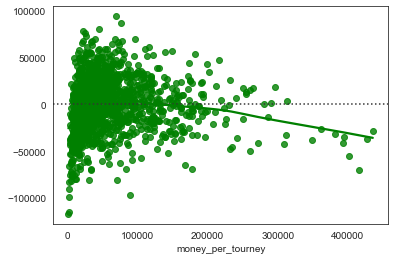

In [51]:
sns.residplot( y_train, y_train_pred,lowess=True, color="g")

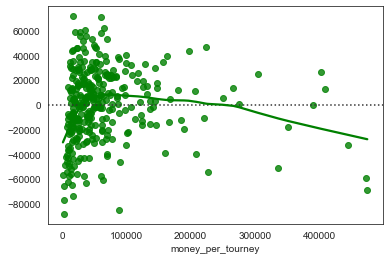

In [44]:
sns.residplot( y_test, y_pred, lowess=True, color="g")

## Creating Bar Charts for Top 10 and Bottom 10 golf money earners per tournament

In [52]:
#Make new column with player name and season in parenthesis (first update season column to string)
df['Season'] = df['Season'].astype(str)

In [53]:
#make new column with player name and season
df["Player Name (Season)"] = df["Player Name"]+ " " + "(" +df["Season"] +")"

In [54]:
df.head()

Variable,Player Name,Season,one_putts_per_rd,Proximity to Hole - (AVG),two_putts_per_rd,Apex Height - (AVG.),avg_dist_putts_made,avg_dist_to_hole_2nd_shot,avg_going_for_it_distance,back_9_par_3_avg,back_9_par_4_avg,back_9_par_5_avg,back_9_score_avg,ball_speed,GIR_rank,birdie_avg,birdie_or_better_pct,bogey_pct,carry_distance,bounce_back_pct,club_head_speed,Distance from Center of Fairway - (AVG),driving_accuracy_pct,driving_distance_avg,fairway_bunker_pct,front_9_par_3_avg,front_9_par_4_avg,front_9_par_5_avg,front_9_score_avg,GIR_pct,GoFIR_pct,top_10_finishes,1st_place_finishes,rough_scrambling_pct,sand_scrambling_pct,fringe_scrambling_pct,scrambling_pct,putts_per_round_avg,events,OFFICIAL MONEY WON,money_per_tourney,Player Name (Season),score_avg
1,Aaron Baddeley,2010,7.28,"37' 9""",10.13,"100' 1""","4' 5""",166.1,257.8,3.09,4.02,4.72,35.51,177.01,164.0,3.76,21.63,16.73,286.6,27.72,119.95,"25' 11""",56.65,298.9,4.6,3.08,4.01,4.66,35.10,64.60,69.51,2,0,54.58,57.66,91.04,57.10,28.57,26,879317,33819.884615,Aaron Baddeley (2010),70.61
2,Aaron Baddeley,2011,7.31,"37' 5""",9.48,"94' 1""","4' 3""",168.4,251.0,3.12,4.01,4.70,35.40,176.34,97.0,4.08,23.09,16.38,281.7,26.15,119.14,"26' 2""",55.67,296.2,6.0,3.08,3.99,4.48,34.82,65.48,71.86,5,1,49.32,56.73,94.74,59.44,28.39,24,3094692,128945.500000,Aaron Baddeley (2011),70.22
3,Aaron Baddeley,2012,7.96,"38' 3""",9.39,"97' 2""","4' 2""",169.4,253.2,3.10,4.09,4.68,35.92,176.75,190.0,3.51,19.75,18.83,288.8,18.97,119.05,"28' 0""",54.30,292.0,7.5,3.15,4.08,4.61,35.64,58.10,64.24,3,0,59.26,65.52,96.23,59.85,28.07,22,1215753,55261.500000,Aaron Baddeley (2012),71.56
4,Aaron Baddeley,2013,8.17,"39' 3""",9.09,"92' 1""","4' 4""",179.8,253.6,3.11,4.15,4.60,35.97,176.32,178.0,3.50,20.20,19.87,282.6,21.52,118.89,"27' 2""",50.71,288.5,6.6,3.11,4.07,4.63,35.61,58.00,61.21,2,0,54.50,55.32,94.59,57.72,27.80,24,721023,30042.625000,Aaron Baddeley (2013),71.58
5,Aaron Baddeley,2014,7.94,"39' 1""",9.51,"101' 9""","4' 5""",176.5,250.1,3.16,4.07,4.61,35.65,174.49,174.0,3.54,19.83,17.75,283.3,20.36,117.54,"29' 3""",52.29,293.8,7.3,3.03,4.09,4.64,35.49,59.80,62.99,2,0,58.01,57.14,89.74,60.27,28.15,24,942558,39273.250000,Aaron Baddeley (2014),71.14


In [61]:
#show top 10 golf earners per tournament
top_10 = df.sort_values('money_per_tourney', ascending=False).head(10)[['Player Name (Season)', 'money_per_tourney']]
top_10

Variable,Player Name (Season),money_per_tourney
10345,Tiger Woods (2013),475191.000000
8854,Rory McIlroy (2012),473408.882353
5326,Jordan Spieth (2015),445572.740741
8856,Rory McIlroy (2014),435794.473684
5598,Justin Rose (2018),427930.368421
3111,Dustin Johnson (2017),415818.714286
4560,Jason Day (2015),408840.434783
3112,Dustin Johnson (2018),402731.000000
4561,Jason Day (2016),402255.550000
1527,Brooks Koepka (2018),394113.722222


In [62]:
#create bar chart (x-value)
x = top_10['Player Name (Season)']

In [63]:
#create bar chart (x-value)
y = top_10['money_per_tourney']

<BarContainer object of 10 artists>

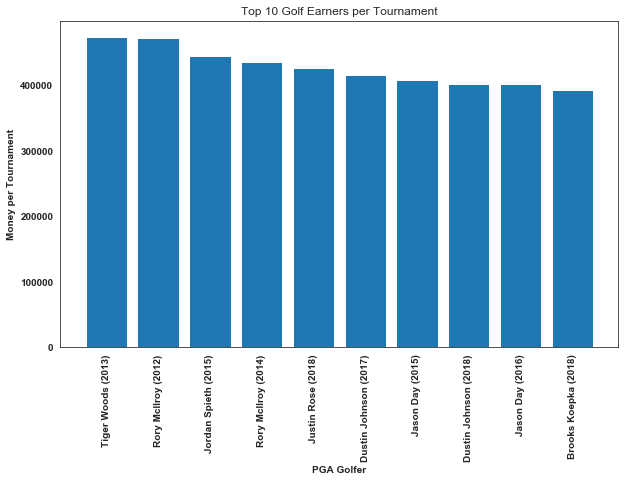

In [64]:
#create bar chart
plt.figure(figsize = (10, 6))
plt.xlabel('PGA Golfer')
plt.ylabel('Money per Tournament')
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.title('Top 10 Golf Earners per Tournament')
plt.xticks(rotation=90)
plt.bar(x, y)

In [65]:
#create bottom 10 earners bar chart
bottom_10 = df.sort_values('money_per_tourney', ascending=False).tail(10)[['Player Name (Season)', 'money_per_tourney']]
bottom_10

Variable,Player Name (Season),money_per_tourney
1319,Brendon Todd (2016),2612.827586
9817,Stephen Gangluff (2012),2552.260870
498,Andrew McLardy (2010),2528.857143
3747,Greg Kraft (2010),2371.636364
1161,Brad Faxon (2010),2311.750000
6090,Kyle Thompson (2012),2066.363636
533,Andrew Yun (2018),1889.363636
6095,Kyle Thompson (2018),1130.818182
8648,Robert Allenby (2016),1052.958333
9939,Steven Bowditch (2017),912.962963


In [66]:
#create x-value 
x = bottom_10['Player Name (Season)']

In [67]:
#create y-value
y = bottom_10['money_per_tourney']

<BarContainer object of 10 artists>

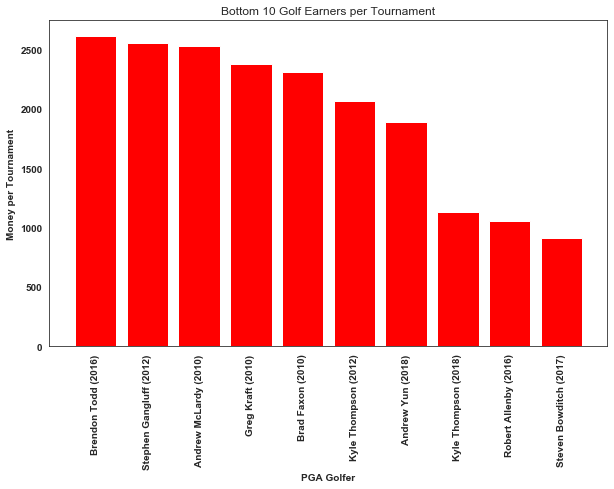

In [68]:
#create bar chart for bottom 10 earners
plt.figure(figsize = (10, 6))
plt.xlabel('PGA Golfer')
plt.ylabel('Money per Tournament')
plt.rcParams["font.weight"] = "bold"
plt.rcParams["axes.labelweight"] = "bold"
plt.title('Bottom 10 Golf Earners per Tournament')
plt.xticks(rotation=90)
plt.bar(x, y, color='red')



## Hypothesis Testing - Is there a difference in earnings per tournament between players that hit longer drives and players that hit shorter drives?

In [69]:
#Hnull - long drivers' earnings per tourney = short drivers' earnings per tourney
#Halternate - long driver's earnings per tourney =/ short drivers' earnings per tourney

In [70]:
df['driving_distance_avg'].describe()

count    1678.000000
mean      290.807688
std         8.916631
min       266.400000
25%       284.900000
50%       290.550000
75%       296.400000
max       319.700000
Name: driving_distance_avg, dtype: float64

In [71]:
df['driving'] = df.driving_distance_avg.map(lambda x: "Short (<290.55 yards)" if x<290.55 else "Long (>290.55 yeards)")

In [72]:
driving_df = df.groupby('driving').money_per_tourney

In [60]:
driving_df.describe()

,count,mean,std,min,25%,50%,75%,max
driving,,,,,,,,
Long (>290.55 yeards),839.0,76043.672721,73800.899361,1889.363636,28252.741071,52972.538462,97782.464158,475191.000000
Short (<290.55 yards),839.0,45838.229445,41781.648853,912.962963,18503.359127,33856.900000,59446.073864,351748.105263


In [61]:
top = 76043.67 - 45838.23

In [62]:
bottom = (((73800.90 * 73800.90)/839) + ((41781.65 * 41781.65)/839))**.5

In [63]:
t = top/bottom
t

10.316511824549346

In [64]:
t_crit = np.round(stats.t.ppf(1 - .05, df = 1676), 3)
t_crit

1.646

In [65]:
# Can reject the null hypothesis that Long Drivers' earnings per tourney = Short Drivers' earnings per tourney

Text(0.5, 1.0, 'Money earned per Tournament based on Driving Distance')

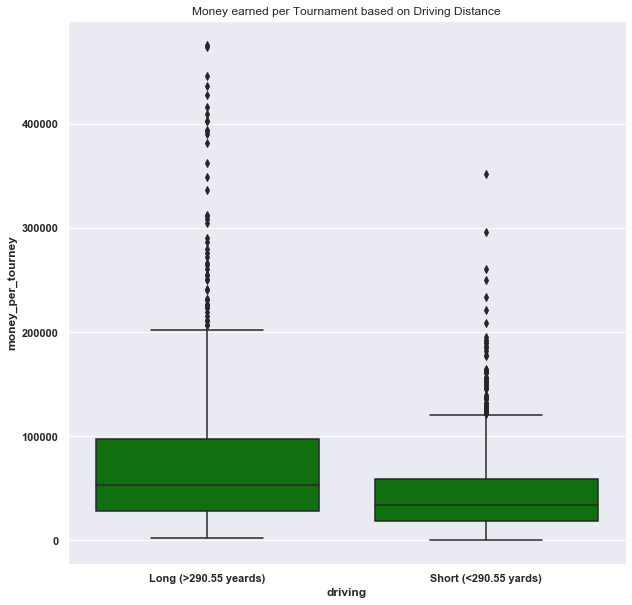

In [66]:
plt.figure(figsize=(10,10))
sns.set(font_scale = 1)
sns.boxplot(
    data= df,
    x='driving',
    y='money_per_tourney',
    color='green').set_title('Money earned per Tournament based on Driving Distance')


## Hypothesis Testing - Is there a difference in earnings per tournament between Accurate and Inaccurate Drivers?

In [67]:
#Hnull - accurate drivers' earnings per tourney = inaccurate drivers' earnings per tourney
#Halternate - accurate driver's earnings per tourney =/ inaccurate drivers' earnings per tourney

In [68]:
df['driving_accuracy_pct'].describe()

count    1678.000000
mean       61.440560
std         5.058845
min        43.020000
25%        57.942500
50%        61.430000
75%        64.910000
max        76.880000
Name: driving_accuracy_pct, dtype: float64

In [69]:
df['driving_acc'] = df.driving_accuracy_pct.map(lambda x: "Inaccurate (<61.43%)" if x<=61.4300 else "Accurate (>61.43%)")

In [70]:
accuracy_df = df.groupby('driving_acc').money_per_tourney
accuracy_df.describe()

,count,mean,std,min,25%,50%,75%,max
driving_acc,,,,,,,,
Accurate (>61.43%),838.0,62093.551911,57818.466520,1130.818182,23864.346561,43590.196429,80205.864583,475191.000000
Inaccurate (<61.43%),840.0,59791.094543,65591.418008,912.962963,21289.673611,38411.903361,71945.743506,473408.882353


In [71]:
top = 62093.5519 - 59791.0945

In [72]:
bottom = (((57818.4665 * 57818.4665)/838) + ((65591.418 * 65591.418)/840))**.5

In [73]:
t = top/bottom
t

0.7627989135692685

In [74]:
t_crit = np.round(stats.t.ppf(1 - .05, df = 1676), 3)
t_crit

1.646

In [75]:
#Can not reject the null hypothesis that Accurate Drivers' earnings = Inaccurate Drivers' earnings

Text(0.5, 1.0, 'Money earned per Tournament based on Driving Accuracy')

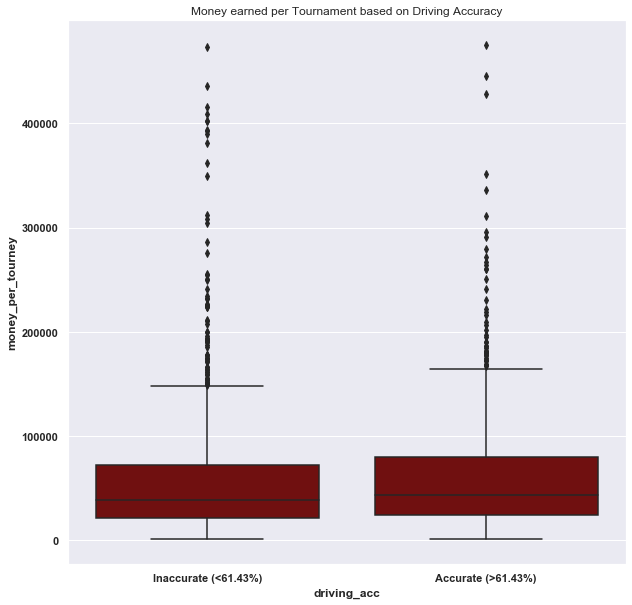

In [76]:
plt.figure(figsize=(10,10))
sns.set(font_scale = 1)
sns.boxplot(
    data= df,
    x='driving_acc',
    y='money_per_tourney',
    color='maroon').set_title('Money earned per Tournament based on Driving Accuracy')

## Hypothesis Testing - Is there a difference in earnings per tournament between "Good" putters and "Bad" putters?

In [77]:
#Hnull - good putters' earnings per tourney = bad putters' earnings per tourney
#Halternate - good putters' earnings per tourney =/ bad putters' earnings per tourney

In [78]:
df['putts_per_round_avg'].describe()

count    1678.000000
mean       29.163331
std         0.518468
min        27.510000
25%        28.810000
50%        29.140000
75%        29.520000
max        31.000000
Name: putts_per_round_avg, dtype: float64

In [79]:
df['putting'] = df.putts_per_round_avg.map(lambda x: "Good (<29.14 putts)" if x<=29.14 else "Bad (>29.14 putts)")

In [80]:
putting_df = df.groupby('putting').money_per_tourney
putting_df.describe()

,count,mean,std,min,25%,50%,75%,max
putting,,,,,,,,
Bad (>29.14 putts),837.0,50135.940970,47190.014525,912.962963,18270.772727,35833.086957,63184.875000,336222.578947
Good (<29.14 putts),841.0,71694.569947,71988.841568,2311.750000,27063.961538,48197.238095,87489.535714,475191.000000


In [81]:
top = 71694.57 - 50135.94

In [82]:
bottom = (((71988.84 * 71988.84)/841) + ((47190.0145 * 47190.0145)/837))**.5

In [83]:
t = top/bottom
t

7.258036867180399

In [84]:
t_crit = np.round(stats.t.ppf(1 - .05, df = 1676), 3)
t_crit

1.646

In [85]:
#Can reject the null hypothesis that good putters' earnings per tourney is equal to bad putters' earnings per tourney

Text(0.5, 1.0, 'Money earned per Tournament based on Putting Abilities')

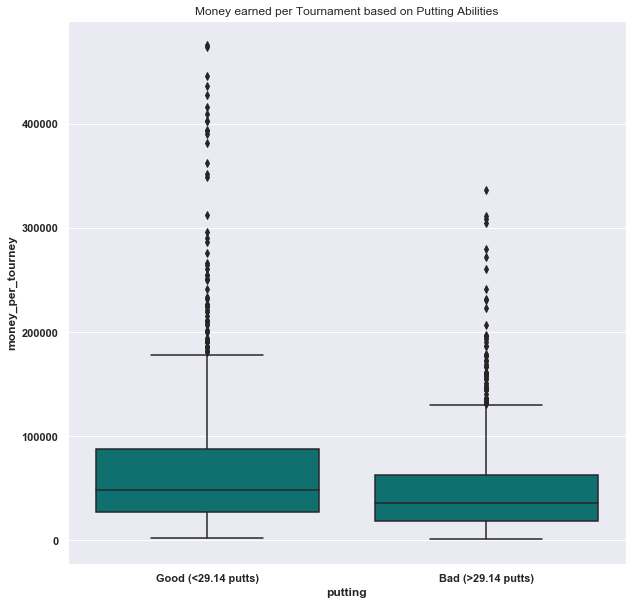

In [86]:
plt.figure(figsize=(10,10))
sns.set(font_scale = 1)
sns.boxplot(
    data= df,
    x='putting',
    y='money_per_tourney',
    color='teal').set_title('Money earned per Tournament based on Putting Abilities')

## Hypothesis Testing - Is there a difference in earnings per tournament between golfers with higher GIR% and golfers with lower GIR%?

In [87]:
#Hnull - Golfers with higher GIR% make the same earnings per tournament as golfers with lower GIR%
#Halternative - Golfers with higher GIR% do not make the same earnings per tournament as golfers with lower GIR%

In [88]:
df['GIR_pct'].describe()

count    1678.000000
mean       65.661675
std         2.745411
min        53.540000
25%        63.830000
50%        65.790000
75%        67.580000
max        73.520000
Name: GIR_pct, dtype: float64

In [89]:
df['GIR'] = df.GIR_pct.map(lambda x: "High (>65.79%)" if x>=65.79 else "Low (<65.79%")

In [90]:
GIR_df = df.groupby('GIR').money_per_tourney
GIR_df.describe()

,count,mean,std,min,25%,50%,75%,max
GIR,,,,,,,,
High (>65.79%),840.0,76765.656445,74746.442830,2528.857143,30116.559953,50637.121083,99380.840062,475191.00
Low (<65.79%,838.0,45078.477928,39427.501971,912.962963,17157.395722,33430.776786,60812.287879,254373.05


In [91]:
top = 76765.656 - 45078.478

In [92]:
bottom = (((74746.44 * 74746.44)/840) + ((39427.5 * 39427.5)/838))**.5

In [93]:
t = top/bottom
t

10.864604986651644

In [94]:
t_crit = np.round(stats.t.ppf(1 - .05, df = 1676), 3)
t_crit

1.646

In [95]:
#Can reject the null hypothesis that golfers with higher GIR% make the same earnings per tournament as golfers with lower GIR%

Text(0.5, 1.0, 'Money earned per Tournament based on GIR%')

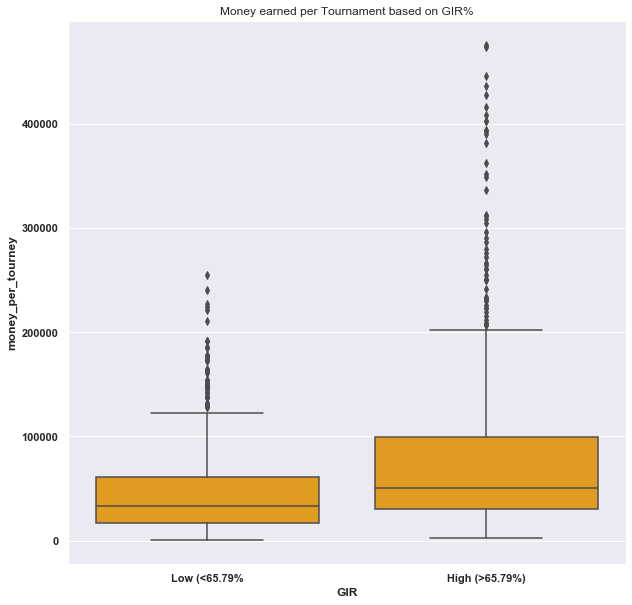

In [96]:
plt.figure(figsize=(10,10))
sns.set(font_scale = 1)
sns.boxplot(
    data= df,
    x='GIR',
    y='money_per_tourney',
    color='orange').set_title('Money earned per Tournament based on GIR%')

## Confidence Interval around Money earned per Tournament (95% Confidence Interval)

In [97]:
df['money_per_tourney'].describe()

count      1678.000000
mean      60940.951083
std       61824.131924
min         912.962963
25%       22370.146098
50%       41664.183862
75%       75163.452724
max      475191.000000
Name: money_per_tourney, dtype: float64

In [98]:
#create confidence interval
mean = 60940.95
std_deviation = 61824.13
n = 1678

lower = mean - (1.96*std_deviation/(n**.5))
upper = mean + (1.96*std_deviation/(n**.5))

(lower, mean, upper)

(57982.81420465339, 60940.95, 63899.085795346604)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x1a2ace8d50>]],
      dtype=object)

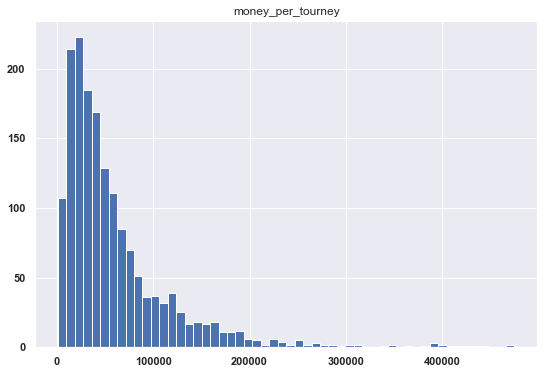

In [99]:
#plot confidence interval
pd.DataFrame(df['money_per_tourney']).hist(bins='auto',figsize=(9,6))

## Mulitple Linear Regression Model 2

In [100]:
df.head()

Variable,Player Name,Season,one_putts_per_rd,Proximity to Hole - (AVG),two_putts_per_rd,Apex Height - (AVG.),avg_dist_putts_made,avg_dist_to_hole_2nd_shot,avg_going_for_it_distance,back_9_par_3_avg,back_9_par_4_avg,back_9_par_5_avg,back_9_score_avg,ball_speed,GIR_rank,birdie_avg,birdie_or_better_pct,bogey_pct,carry_distance,bounce_back_pct,club_head_speed,Distance from Center of Fairway - (AVG),driving_accuracy_pct,driving_distance_avg,fairway_bunker_pct,front_9_par_3_avg,front_9_par_4_avg,front_9_par_5_avg,front_9_score_avg,GIR_pct,GoFIR_pct,top_10_finishes,1st_place_finishes,rough_scrambling_pct,sand_scrambling_pct,fringe_scrambling_pct,scrambling_pct,putts_per_round_avg,events,OFFICIAL MONEY WON,money_per_tourney,Player Name (Season),driving,driving_acc,putting,GIR
1,Aaron Baddeley,2010,7.28,"37' 9""",10.13,"100' 1""","4' 5""",166.1,257.8,3.09,4.02,4.72,35.51,177.01,164.0,3.76,21.63,16.73,286.6,27.72,119.95,"25' 11""",56.65,298.9,4.6,3.08,4.01,4.66,35.10,64.60,69.51,2,0,54.58,57.66,91.04,57.10,28.57,26,879317,33819.884615,Aaron Baddeley (2010),Long (>290.55 yeards),Inaccurate (<61.43%),Good (<29.14 putts),Low (<65.79%
2,Aaron Baddeley,2011,7.31,"37' 5""",9.48,"94' 1""","4' 3""",168.4,251.0,3.12,4.01,4.70,35.40,176.34,97.0,4.08,23.09,16.38,281.7,26.15,119.14,"26' 2""",55.67,296.2,6.0,3.08,3.99,4.48,34.82,65.48,71.86,5,1,49.32,56.73,94.74,59.44,28.39,24,3094692,128945.500000,Aaron Baddeley (2011),Long (>290.55 yeards),Inaccurate (<61.43%),Good (<29.14 putts),Low (<65.79%
3,Aaron Baddeley,2012,7.96,"38' 3""",9.39,"97' 2""","4' 2""",169.4,253.2,3.10,4.09,4.68,35.92,176.75,190.0,3.51,19.75,18.83,288.8,18.97,119.05,"28' 0""",54.30,292.0,7.5,3.15,4.08,4.61,35.64,58.10,64.24,3,0,59.26,65.52,96.23,59.85,28.07,22,1215753,55261.500000,Aaron Baddeley (2012),Long (>290.55 yeards),Inaccurate (<61.43%),Good (<29.14 putts),Low (<65.79%
4,Aaron Baddeley,2013,8.17,"39' 3""",9.09,"92' 1""","4' 4""",179.8,253.6,3.11,4.15,4.60,35.97,176.32,178.0,3.50,20.20,19.87,282.6,21.52,118.89,"27' 2""",50.71,288.5,6.6,3.11,4.07,4.63,35.61,58.00,61.21,2,0,54.50,55.32,94.59,57.72,27.80,24,721023,30042.625000,Aaron Baddeley (2013),Short (<290.55 yards),Inaccurate (<61.43%),Good (<29.14 putts),Low (<65.79%
5,Aaron Baddeley,2014,7.94,"39' 1""",9.51,"101' 9""","4' 5""",176.5,250.1,3.16,4.07,4.61,35.65,174.49,174.0,3.54,19.83,17.75,283.3,20.36,117.54,"29' 3""",52.29,293.8,7.3,3.03,4.09,4.64,35.49,59.80,62.99,2,0,58.01,57.14,89.74,60.27,28.15,24,942558,39273.250000,Aaron Baddeley (2014),Long (>290.55 yeards),Inaccurate (<61.43%),Good (<29.14 putts),Low (<65.79%


In [114]:
#create multiple linear regression model (#2) with different statistics
ols('money_per_tourney~back_9_par_3_avg+back_9_par_4_avg+back_9_par_5_avg+front_9_par_3_avg+front_9_par_4_avg+front_9_par_5_avg+events+driving_accuracy_pct+GIR_pct+carry_distance+birdie_avg',data=df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:      money_per_tourney   R-squared:                       0.504
Model:                            OLS   Adj. R-squared:                  0.500
Method:                 Least Squares   F-statistic:                     153.7
Date:                Sun, 21 Jun 2020   Prob (F-statistic):          5.21e-244
Time:                        17:29:43   Log-Likelihood:                -20305.
No. Observations:                1678   AIC:                         4.063e+04
Df Residuals:                    1666   BIC:                         4.070e+04
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept             3.604e+06   2.69e+05     13.388      0.000    3.08e+06    4.13e+06
back_9_par_3_avg     -9.457e+04   2.01e+04     -4.699      0.000   -1.34e+05   -5.51e+04
back_9_par_4_avg      -2.71e+05   3.19e+04     -8.498      0.000   -3.34e+05   -2.08e+05
back_9_par_5_avg     -9.242e+04   1.62e+04     -5.713      0.000   -1.24e+05   -6.07e+04
front_9_par_3_avg    -6.039e+04   2.13e+04     -2.837      0.005   -1.02e+05   -1.86e+04
front_9_par_4_avg    -3.059e+05   3.34e+04     -9.167      0.000   -3.71e+05    -2.4e+05
front_9_par_5_avg    -1.075e+05   1.51e+04     -7.096      0.000   -1.37e+05   -7.78e+04
events               -2565.3862    277.053     -9.260      0.000   -3108.795   -2021.978
driving_accuracy_pct  1210.9623    322.550      3.754      0.000     578.317    1843.608
GIR_pct              -3921.1723    576.257     -6.805      0.000   -5051.437   -2790.908
carry_distance        1090.0488    154.755      7.044      0.000     786.513    1393.584
birdie_avg            4.177e+04   6513.896      6.413      0.000     2.9e+04    5.45e+04
==============================================================================
Omnibus:                      623.843   Durbin-Watson:                   1.426
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3590.462
Skew:                           1.636   Prob(JB):                         0.00
Kurtosis:                       9.376   Cond. No.                     7.38e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.38e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [102]:
features=['back_9_par_3_avg', 'back_9_par_4_avg', 'back_9_par_5_avg', 'front_9_par_4_avg',
          'front_9_par_3_avg', 'front_9_par_5_avg', 'front_9_score_avg', 'events', 'driving_accuracy_pct',
          'GIR_pct', 'carry_distance', 'birdie_avg', 'avg_going_for_it_distance'
         ]
df_features = df[features]
target = df['money_per_tourney']

In [103]:
X_train, X_test, y_train, y_test = train_test_split(df_features, target, random_state=22,test_size=0.2)

In [104]:
#instantiate a linear regression object
lm = LinearRegression()
#fit the linear regression to the data
lm = lm.fit(X_train, y_train)
y_train_pred = lm.predict(X_train)
train_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))
print('Training Root Mean Squared Error:' , train_rmse)

Training Root Mean Squared Error: 41116.68353981365


In [105]:
y_pred = lm.predict(X_test)
#evaluate the predictions on the test examples
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Testing Root Mean Squared Error:' , test_rmse)
print('Training: ', int(train_rmse), "vs. Testing: ", int(test_rmse))

Testing Root Mean Squared Error: 51136.19430936601
Training:  41116 vs. Testing:  51136


## Multiple Linear Regression Model 3 - Score Avg as Target Variable

In [ ]:
#create confidence interval that determines scoring average based on the stats used in model 1

In [106]:
df['score_avg'] = df['front_9_score_avg'] + df['back_9_score_avg']

In [116]:
ols('score_avg~ball_speed+scrambling_pct+GIR_rank+carry_distance+birdie_or_better_pct+putts_per_round_avg+scrambling_pct+events+driving_accuracy_pct',data=df).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              score_avg   R-squared:                       0.890
Model:                            OLS   Adj. R-squared:                  0.890
Method:                 Least Squares   F-statistic:                     1696.
Date:                Sun, 21 Jun 2020   Prob (F-statistic):               0.00
Time:                        17:30:07   Log-Likelihood:                 269.31
No. Observations:                1678   AIC:                            -520.6
Df Residuals:                    1669   BIC:                            -471.8
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
========================================================================================
                           coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------
Intercept               78.0590      0.812     96.099      0.000      76.466      79.652
ball_speed              -0.0124      0.002     -5.846      0.000      -0.017      -0.008
scrambling_pct          -0.0842      0.002    -37.196      0.000      -0.089      -0.080
GIR_rank                 0.0042      0.000     23.075      0.000       0.004       0.005
carry_distance           0.0061      0.001      5.751      0.000       0.004       0.008
birdie_or_better_pct    -0.1919      0.006    -34.872      0.000      -0.203      -0.181
putts_per_round_avg      0.0780      0.023      3.352      0.001       0.032       0.124
events                  -0.0054      0.001     -4.119      0.000      -0.008      -0.003
driving_accuracy_pct    -0.0098      0.002     -6.069      0.000      -0.013      -0.007
==============================================================================
Omnibus:                      144.036   Durbin-Watson:                   1.780
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              449.839
Skew:                           0.418   Prob(JB):                     2.08e-98
Kurtosis:                       5.395   Cond. No.                     5.63e+04
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.63e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [117]:
features=['ball_speed', 'scrambling_pct',
          'GIR_rank', 'putts_per_round_avg', 'events', 'carry_distance', 'driving_accuracy_pct', 'birdie_or_better_pct']
df_features = df[features]
target = df['score_avg']

In [118]:
X_train, X_test, y_train, y_test = train_test_split(df_features, target, random_state=22,test_size=0.2)

In [119]:
#instantiate a linear regression object
lm = LinearRegression()
#fit the linear regression to the data
lm = lm.fit(X_train, y_train)
y_train_pred = lm.predict(X_train)
train_rmse = np.sqrt(metrics.mean_squared_error(y_train, y_train_pred))
print('Training Root Mean Squared Error:' , train_rmse)

Training Root Mean Squared Error: 0.20715274161909608


In [120]:
y_pred = lm.predict(X_test)
#evaluate the predictions on the test examples
test_rmse = np.sqrt(metrics.mean_squared_error(y_test, y_pred))
print('Testing Root Mean Squared Error:' , test_rmse)
print('Training: ', int(train_rmse), "vs. Testing: ", int(test_rmse))

Testing Root Mean Squared Error: 0.20304313765349155
Training:  0 vs. Testing:  0
